# Example SEM Image analysis: porosity & fiber diameter
This notebook provides a step-by-step example of a single SEM image being analyzed using skimage and quanfima, with visualization provided by napari.
First import needed modules. When running in python3, the `quanfima` module has some problems due to relatively old dependencies. A fork capable of running 2D image fiber analysis in python3 is available: [https://github.com/psobolewskiPhD/quanfima](https://github.com/psobolewskiPhD/quanfima)

The workflow begisn with importing the needed modules.

In [1]:
import napari
import numpy as np
from quanfima import morphology as mrph
from skimage import filters, io, morphology
from skimage.color import rgb2gray

Next, we read in a representative image using the `skimage` function `imread`, ensure the image is grayscale, and set the scale information (micron per pixel). 

In [2]:
K1 = io.imread('fiber_data/K1.jpg')
scale = [1/35.5, 1/35.5]    #microns per pixel
K1 = rgb2gray(K1)


Next we will set up a napari viewer instance to visualize the image and workflow steps.

In [12]:
viewer = napari.Viewer()
viewer.add_image(K1, scale=scale)   #the scale keyword enables providing scale information
viewer.scale_bar.unit = "um"    #set the scale bar unit
viewer.scale_bar.visible = True #show the scale bar
viewer.scale_bar.colored = True #ensure it has a color so it's more visible

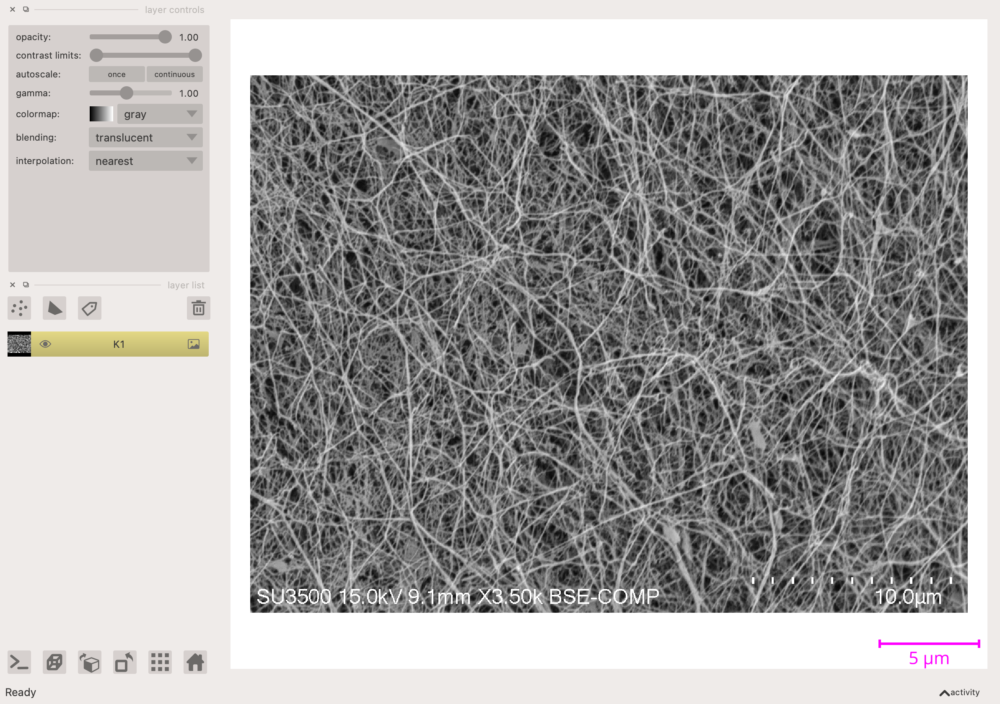

In [13]:
napari.utils.nbscreenshot(viewer)

Next, we will segment the image using `skimage`. First, though, we need to crop out the bottom of the image where the SEM information is located. 
Then, for segmentation we will use the [*Niblack* algorithm](https://scikit-image.org/docs/dev/api/skimage.filters.html#skimage.filters.threshold_niblack) with the default parameters.

In [15]:
K1 = K1[0:890,]     #crop to top 890 px
thresh_NB = filters.threshold_niblack(K1)       #calculate the threshold using Niblack
seg_NB = (K1 > thresh_NB).astype(np.uint8)      #segment the image, taking only pixels above the threshold

To visualize the segmentation, we will add it as a label layer in napari.

In [16]:
viewer.add_labels(seg_NB, scale=scale)

<Labels layer 'seg_NB' at 0x14b1dbb20>

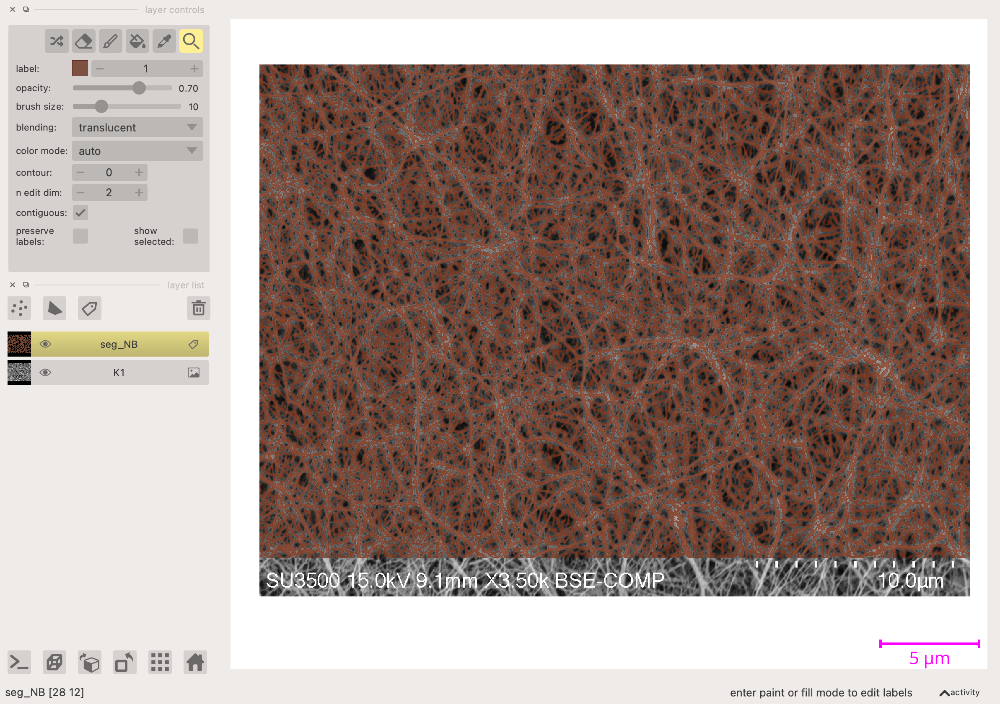

In [17]:
napari.utils.nbscreenshot(viewer)

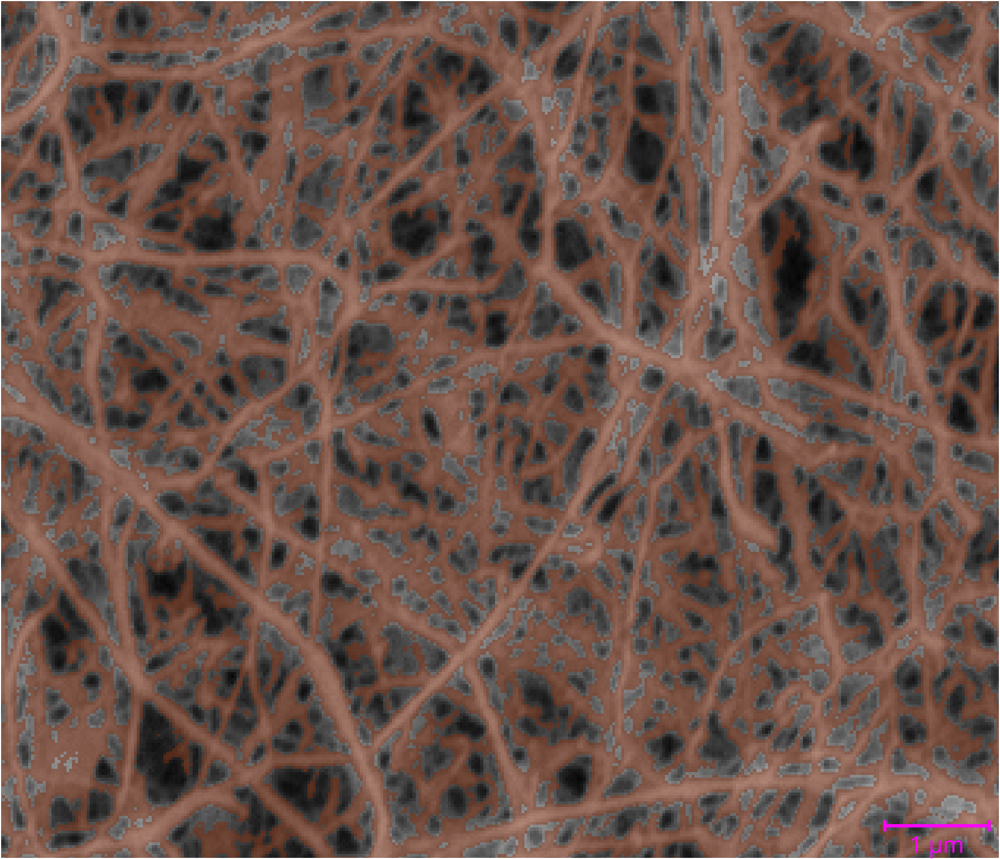

In [18]:
napari.utils.nbscreenshot(viewer, canvas_only=True)     #a zoomed in view, with label opacity reduced to 0.50

To proceed with the workflow, the segmented fibers need to be [skeletonized](https://scikit-image.org/docs/dev/api/skimage.morphology.html?highlight=skeletonize#skimage.morphology.skeletonize), again using `skimage`. The default algorithm will be used (Zhang's), as it is appropriate for 2D analysis.

In [20]:
skeleton = morphology.skeletonize(seg_NB)


Again, we will visualize the skeleton segments using a napari labels layer.

In [23]:
viewer.add_labels(skeleton, scale=scale, name="Skeleton")

<Labels layer 'Skeleton' at 0x14c2bb730>

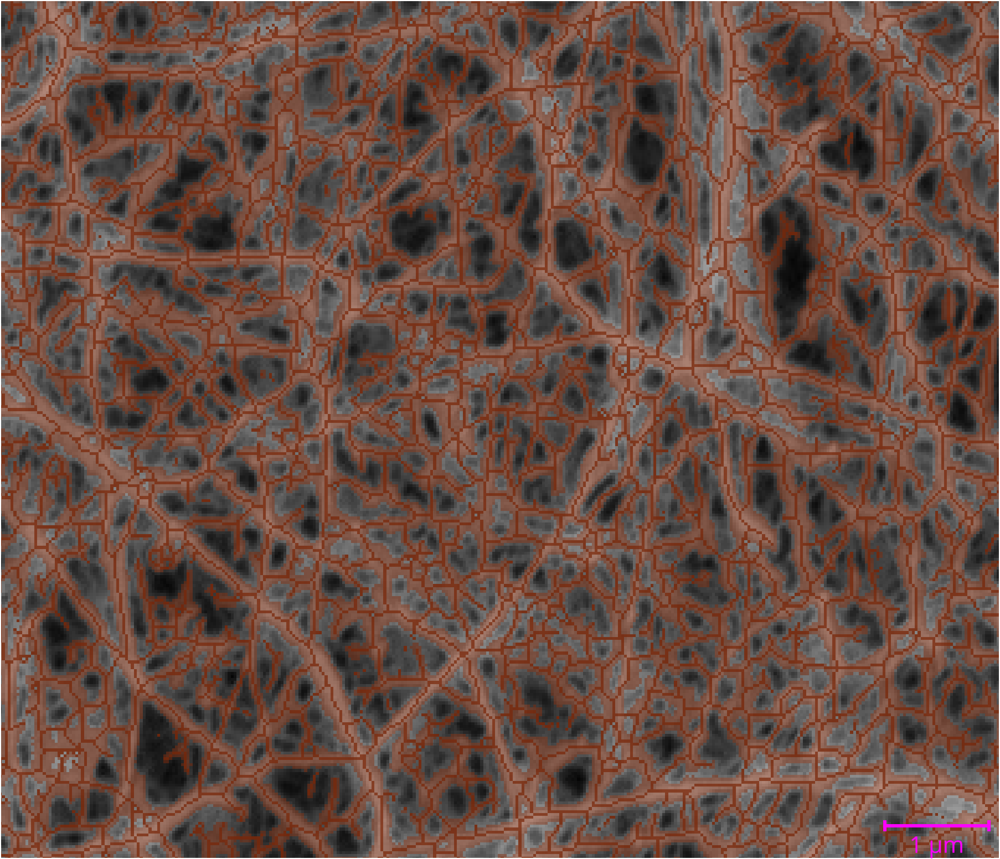

In [22]:
napari.utils.nbscreenshot(viewer, canvas_only=True)     #a zoomed in view, with segmentation and skeleton

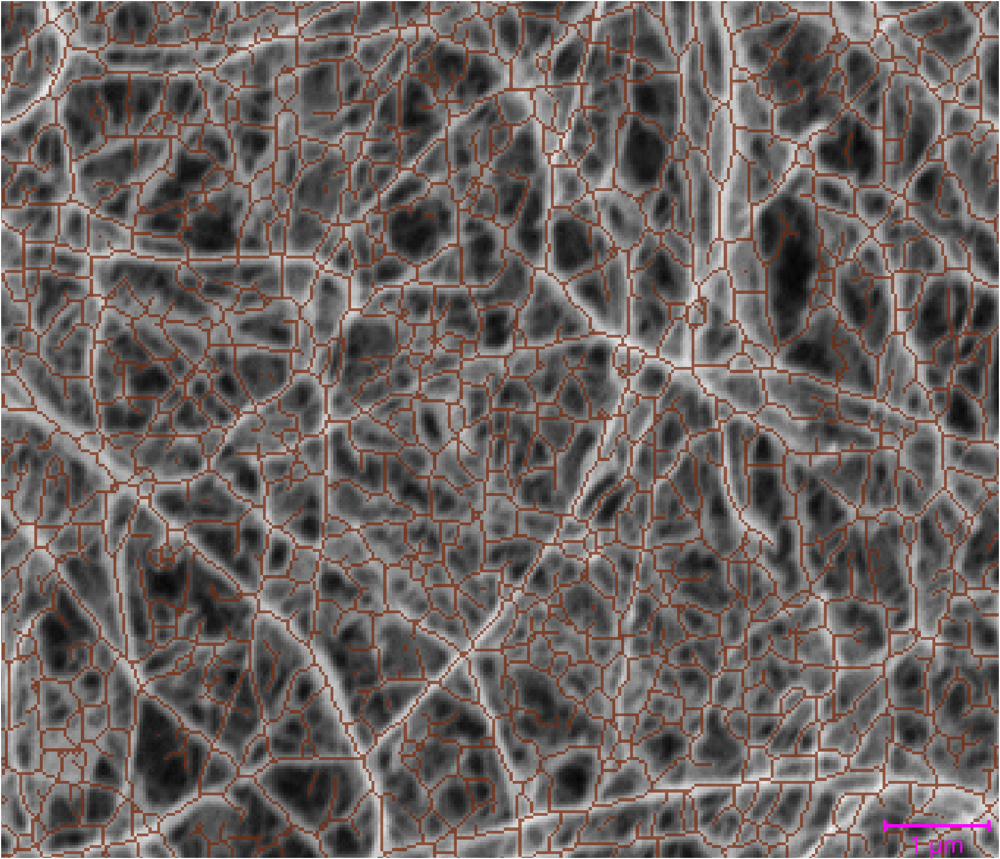

In [24]:
napari.utils.nbscreenshot(viewer, canvas_only=True)     #a zoomed in view, with just image and skeleton

Next, we analyze the segmentation and skeleton using `quanfima` morphological tools. 
First, we will compute the porosity, the ratio of segmented fibers to empty (air) space.

In [29]:
porosity = mrph.calc_porosity(seg_NB)   #calculate the porosity, based on the segmented image
print(porosity)

{'Material 1': 0.4232435042134831}


Next, we run the fiber properties analysis using `quanfima`. You can see more information regarding the function in the [`morphology.py` code of the original codebase](https://github.com/rshkarin/quanfima/blob/da6b4109cb944a1a4861544a87b49d0f712fa8b9/quanfima/morphology.py#L142). Briefly, we need to input the segmented pixels and the calculated skeleton and the outputs `dmap` and `dvals` provide fiber diameter maps and the fiber diameter values, while `ovals` provides the fiber orientations (in radians). The Warning: this can take ~1 min per image.

In [30]:
cskel, fskel, omap, dmap, ovals, dvals = mrph.estimate_fiber_properties(seg_NB, skeleton)


/Users/piotrsobolewski/Dev/quanfima/quanfima/morphology.py:195: FutureWarning: Until version 0.16, threshold_rel was set to 0.1 by default. Starting from version 0.16, the default value is set to None. Until version 0.18, a None value corresponds to a threshold value of 0.1. The default behavior will match skimage.feature.peak_local_max. To avoid this warning, set threshold_rel=0.
  corner_points = feature.corner_peaks(method, min_distance=3)


Now the diameter map (`dmap`) can be visualized with napari and simple summary statistics can be computed. The colormap (LUT) `magma` will be used and the contrast limits will be set to 1–15, which represents the diameters values (in pixels) to be represented by colors. Dark colors (black, dark purple) represent thinner fibers, progressing through reds, and to yellow, which indicates diameters of 15 px and higher (>425 nm).

In [35]:
viewer.add_image(dmap, scale=scale, name="DiameterMap", colormap="magma", opacity=0.5, contrast_limits=[1,15])


<Image layer 'DiameterMap' at 0x177e2ba00>

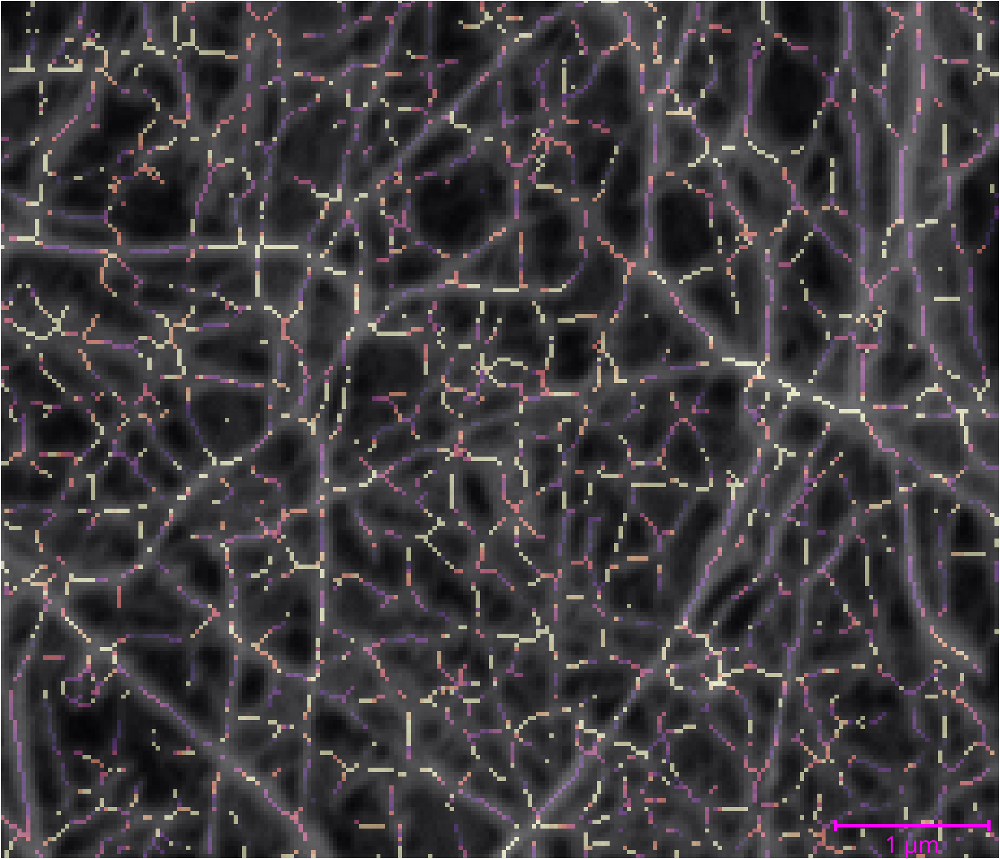

In [36]:
napari.utils.nbscreenshot(viewer, canvas_only=True)     #a zoomed in view of the diameter map overlayed on the image

Summary statistics calculated for `ovals` and `dvals`. Note, these returned values are of type `list` so we convert them into numpy arrays for the calculations.

In [59]:
mean_ovals = np.mean(np.asarray(ovals)*180/np.pi)             #mean converted from radians to degrees
stdev_ovals = np.std(np.asarray(ovals)*180/np.pi)             #standard deviation
mean_dvals = np.mean(np.asarray(dvals)*scale[0])        #mean converted from px to microns
stdev_dvals = np.std(np.asarray(dvals)*scale[0])        #standard deviation

In [62]:
print("Fiber diameter: %3.2f µm ± %3.2f µm" % (mean_dvals, stdev_dvals))
print("Fiber orientation: %3.0f° ± %3.0f°" % (mean_ovals, stdev_ovals))

Fiber diameter: 0.28 µm ± 0.17 µm
Fiber orientation:  83° ±  33°
